In [9]:
import numpy as np 
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt
from statsmodels.graphics.gofplots import qqplot
import plotly.express as px
from sklearn.model_selection import train_test_split, GridSearchCV
%config InlineBackend.figure_format = "svg"
from sklearn.model_selection import train_test_split, GridSearchCV
%config InlineBackend.figure_format = "svg"

In [10]:
df = pd.read_csv("/Users/nouf/Desktop/Airbnb_price_prediction/train.csv")

In [11]:
df

,id,log_price,property_type,room_type,amenities,accommodates,bathrooms,bed_type,cancellation_policy,cleaning_fee,...,latitude,longitude,name,neighbourhood,number_of_reviews,review_scores_rating,thumbnail_url,zipcode,bedrooms,beds
0,6901257,5.010635,Apartment,Entire home/apt,"{""Wireless Internet"",""Air conditioning"",Kitche...",3,1.0,Real Bed,strict,True,...,40.696524,-73.991617,Beautiful brownstone 1-bedroom,Brooklyn Heights,2,100.0,https://a0.muscache.com/im/pictures/6d7cbbf7-c...,11201,1.0,1.0
1,6304928,5.129899,Apartment,Entire home/apt,"{""Wireless Internet"",""Air conditioning"",Kitche...",7,1.0,Real Bed,strict,True,...,40.766115,-73.989040,Superb 3BR Apt Located Near Times Square,Hell's Kitchen,6,93.0,https://a0.muscache.com/im/pictures/348a55fe-4...,10019,3.0,3.0
2,7919400,4.976734,Apartment,Entire home/apt,"{TV,""Cable TV"",""Wireless Internet"",""Air condit...",5,1.0,Real Bed,moderate,True,...,40.808110,-73.943756,The Garden Oasis,Harlem,10,92.0,https://a0.muscache.com/im/pictures/6fae5362-9...,10027,1.0,3.0
3,13418779,6.620073,House,Entire home/apt,"{TV,""Cable TV"",Internet,""Wireless Internet"",Ki...",4,1.0,Real Bed,flexible,True,...,37.772004,-122.431619,Beautiful Flat in the Heart of SF!,Lower Haight,0,NaN,https://a0.muscache.com/im/pictures/72208dad-9...,94117.0,2.0,2.0
4,3808709,4.744932,Apartment,Entire home/apt,"{TV,Internet,""Wireless Internet"",""Air conditio...",2,1.0,Real Bed,moderate,True,...,38.925627,-77.034596,Great studio in midtown DC,Columbia Heights,4,40.0,NaN,20009,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
74106,14549287,4.605170,Apartment,Private room,{},1,1.0,Real Bed,flexible,False,...,40.709025,-73.939405,one room bushwick,Williamsburg,0,NaN,https://a0.muscache.com/im/pictures/55162426/6...,11206.0,1.0,1.0
74107,13281809,5.043425,Apartment,Entire home/apt,"{TV,""Cable TV"",Internet,""Wireless Internet"",Ki...",4,2.0,Real Bed,moderate,True,...,33.871549,-118.396053,Spacious Hermosa 2 BR on PCH,Hermosa Beach,16,93.0,https://a0.muscache.com/im/pictures/2b86560b-a...,90254,2.0,4.0
74108,18688039,5.220356,Apartment,Entire home/apt,"{TV,Internet,""Wireless Internet"",""Air conditio...",5,1.0,Real Bed,moderate,True,...,40.706749,-73.942377,Modern 2 Bedroom Apartment in Williamsburg,Williamsburg,43,94.0,https://a0.muscache.com/im/pictures/7fbe448c-5...,11206.0,2.0,2.0
74109,17045948,5.273000,Apartment,Entire home/apt,"{TV,""Wireless Internet"",""Air conditioning"",Kit...",2,1.0,Real Bed,strict,True,...,40.738535,-74.000157,Designer's Apartment in HEART of NYC,West Village,0,NaN,https://a0.muscache.com/im/pictures/b3971b63-0...,10011,0.0,2.0


In [12]:
df.shape

(74111, 29)

# EDA

# Distribution of log price

/Users/nouf/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


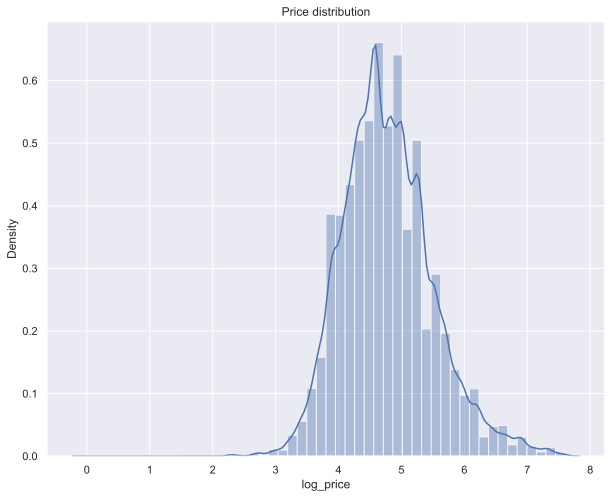

In [13]:
plt.figure(figsize = (10, 8))
sns.distplot(df['log_price'])
plt.title('Price distribution')
plt.show()

In [14]:
#sns.pairplot(df)

# Property type

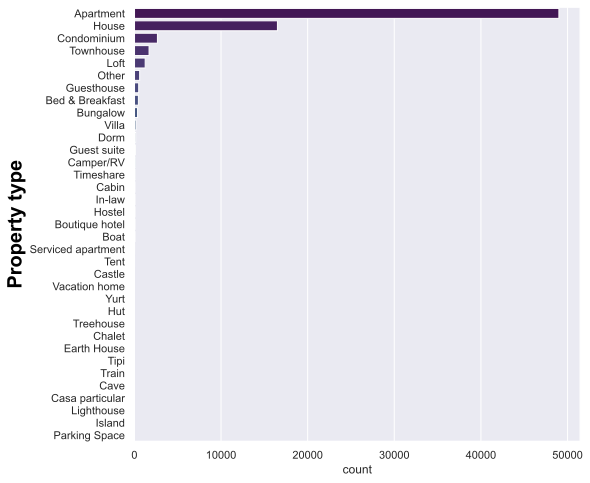

In [15]:
sns.set(style='darkgrid')
plt.figure(figsize=(8,8))
sns.countplot(y = 'property_type',data = df,order = df['property_type'].value_counts().index,palette = "viridis")
plt.ylabel('Property type',fontsize = 20, weight = 'bold',color='black')
#plt.axes().set(facecolor = "White")
plt.show()

# Room type

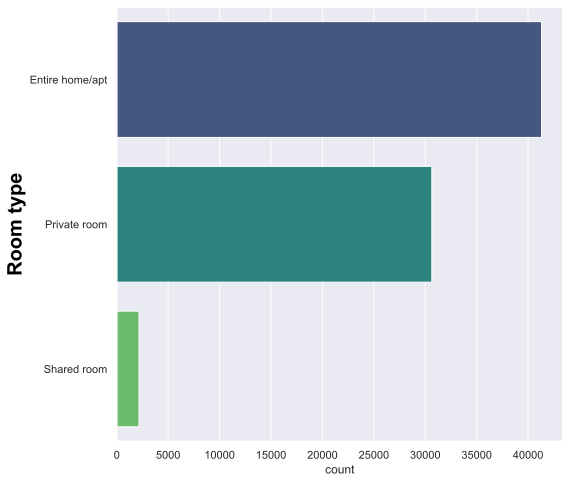

In [16]:
sns.set(style='darkgrid')
plt.figure(figsize=(8,8))
sns.countplot(y = 'room_type',data = df,order = df['room_type'].value_counts().index,palette = "viridis")
plt.ylabel('Room type',fontsize = 20, weight = 'bold',color='black')
#plt.axes().set(facecolor = "White")
plt.show()

# Cancellation policy

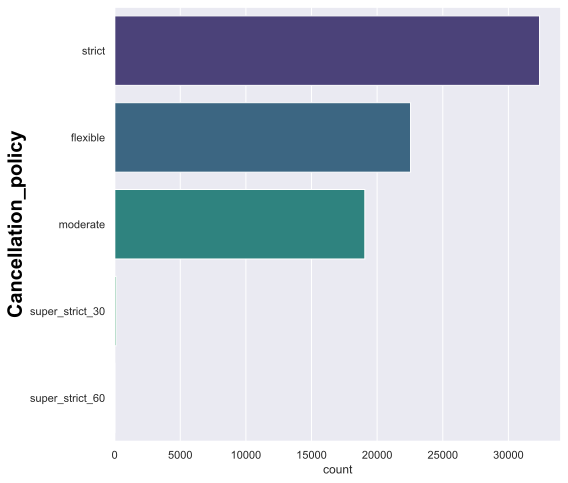

In [17]:
sns.set(style='darkgrid')
plt.figure(figsize=(8,8))
sns.countplot(y = 'cancellation_policy',data = df,order = df['cancellation_policy'].value_counts().index,palette = "viridis")
plt.ylabel('Cancellation_policy',fontsize = 20, weight = 'bold',color='black')
#plt.axes().set(facecolor = "White")
plt.show()

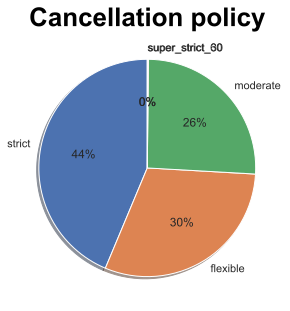

In [18]:
df_g=df['cancellation_policy'].value_counts()
labels=df_g.index
fig,ax1=plt.subplots(1,1,figsize=(5,5))
ax1.pie(df_g,labels=labels, autopct='%1.0f%%',shadow=True, startangle=90)
plt.title("Cancellation policy",fontsize=26, weight = 'bold',color="black")
plt.show()

# bedrooms

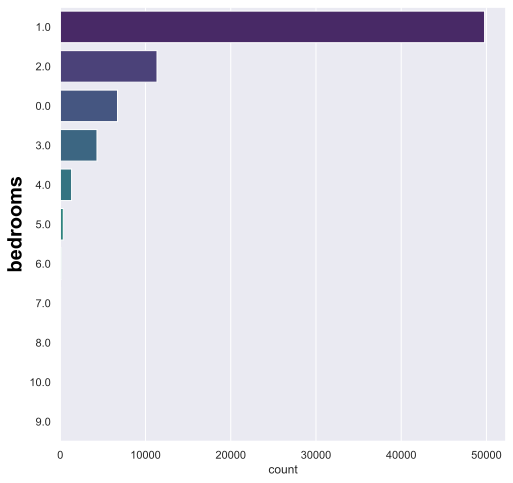

In [19]:
sns.set(style='darkgrid')
plt.figure(figsize=(8,8))
sns.countplot(y = 'bedrooms',data = df,order = df['bedrooms'].value_counts().index,palette = "viridis")
plt.ylabel('bedrooms',fontsize = 20, weight = 'bold',color='black')
#plt.axes().set(facecolor = "White")
plt.show()

#df.bedrooms.value_counts().plot.bar()

# beds

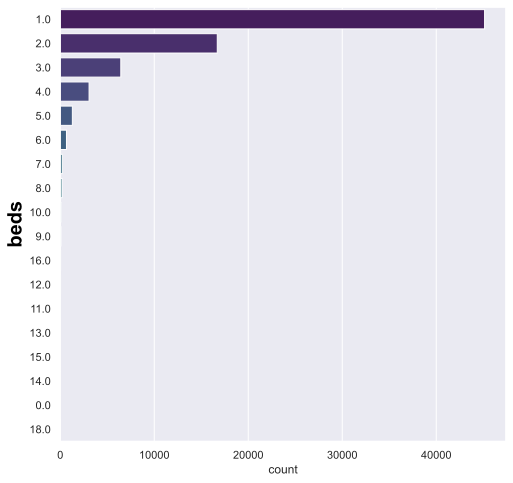

In [20]:
sns.set(style='darkgrid')
plt.figure(figsize=(8,8))
sns.countplot(y = 'beds',data = df,order = df['beds'].value_counts().index,palette = "viridis")
plt.ylabel('beds',fontsize = 20, weight = 'bold',color='black')
#plt.axes().set(facecolor = "White")
plt.show()

#df.bedrooms.value_counts().plot.bar()

# Most popular Neighbourhood

<BarContainer object of 10 artists>

<Figure size 720x720 with 0 Axes>

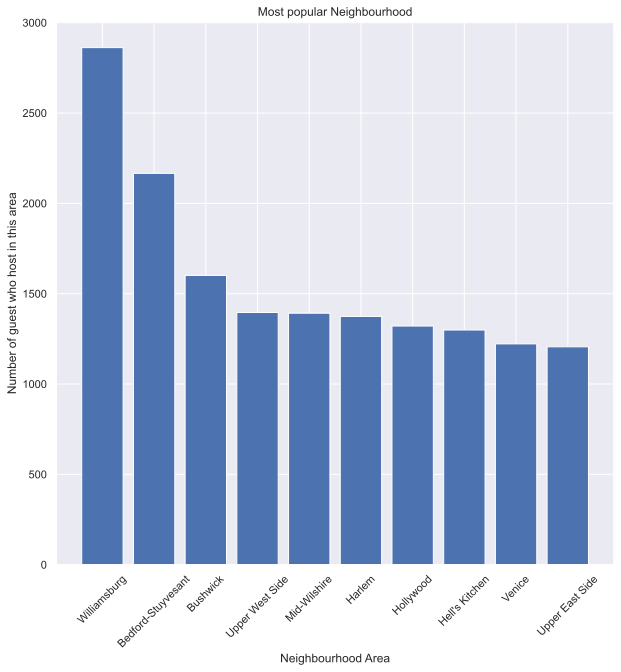

In [21]:
plt.figure(figsize = (10,10))
data = df.neighbourhood.value_counts()[:10]
plt.figure(figsize=(10,10))
x = data.index
y = data.values

plt.title("Most popular Neighbourhood")
plt.xlabel("Neighbourhood Area")
plt.ylabel("Number of guest who host in this area")
plt.xticks(rotation=45)
plt.bar(x,y)

<ipython-input-22-10b2bf15a241>:7: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  plt.axes().set(facecolor = "White")


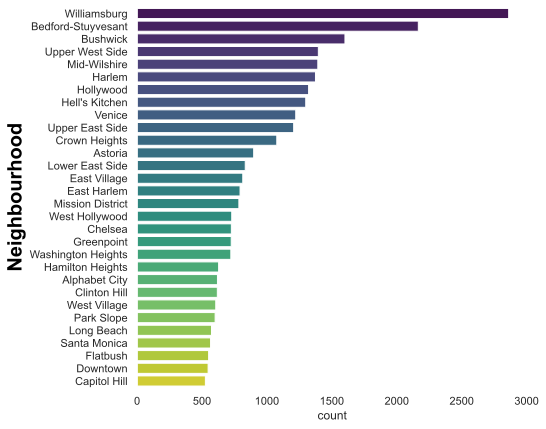

In [22]:
sns.set(style='darkgrid')
plt.figure(figsize=(7,7))
sns.countplot(y = 'neighbourhood',
              data = df,
              order = df['neighbourhood'].value_counts().sort_values(ascending= False).head(30).index,palette= 'viridis')
plt.ylabel('Neighbourhood',fontsize = 20, weight = 'bold',color='black')
plt.axes().set(facecolor = "White")
plt.show()

# City

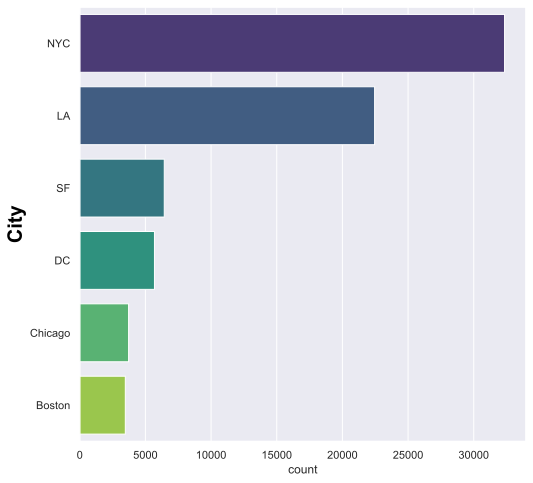

In [23]:
sns.set(style='darkgrid')
plt.figure(figsize=(8,8))
sns.countplot(y = 'city',data = df,order = df['city'].value_counts().index,palette = "viridis")
plt.ylabel('City',fontsize = 20, weight = 'bold',color='black')
#plt.axes().set(facecolor = "White")
plt.show()

In [24]:
import plotly.express as px
def create_map(city):
    price_view = lambda x: 'price: ' + str(round(x, 2))

    if city in {'NYC', 'LA'}:
        fraction = 0.2
    else:
        fraction = 0.6
        
    df_temp = df[df['city'] == city].sample(frac=fraction,random_state=101)
    df_temp['log_price'] = np.round(df_temp['log_price'], 2)
    
    fig = px.scatter_mapbox(df_temp, 
                            lat="latitude", 
                            lon="longitude", 
                            hover_data=["log_price"],
                            color='log_price', 
                            zoom=10)
    
    fig.update_layout(
            title = f'Airbnb prices in {city}',
            geo_scope='usa',
            width=1000, 
            height=600,
            mapbox_style="white-bg",
            mapbox_layers=[{
                 "below": 'traces',
                 "sourcetype": "raster",
                 "sourceattribution": "United States Geological Survey",
                 "source": ["https://basemap.nationalmap.gov/arcgis/rest/services/USGSImageryOnly/MapServer/tile/{z}/{y}/{x}"]
              }]
    )
    #fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
    #fig.update_geos(fitbounds="locations")
    fig.show()
    
#city = interact(lambda x: create_map(x), x=['NYC', 'LA', 'SF', 'DC', 'Chicago', 'Boston'])  #widget
create_map('Chicago')

In [25]:
# Plot all of the variable-to-variable relations as scatterplots
##sns.pairplot(df, height=1.2, aspect=1.5)

# Splits

In [26]:
#df, validation_df  = train_test_split(data,
#                                test_size=0.25,
#                                random_state = 101)

In [27]:
#df_train, df_test  = train_test_split(df,
#                                test_size=0.25,
#                                random_state = 101)

# info

In [28]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 74111 entries, 0 to 74110
Data columns (total 29 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   id                      74111 non-null  int64  
 1   log_price               74111 non-null  float64
 2   property_type           74111 non-null  object 
 3   room_type               74111 non-null  object 
 4   amenities               74111 non-null  object 
 5   accommodates            74111 non-null  int64  
 6   bathrooms               73911 non-null  float64
 7   bed_type                74111 non-null  object 
 8   cancellation_policy     74111 non-null  object 
 9   cleaning_fee            74111 non-null  bool   
 10  city                    74111 non-null  object 
 11  description             74111 non-null  object 
 12  first_review            58247 non-null  object 
 13  host_has_profile_pic    73923 non-null  object 
 14  host_identity_verified  73923 non-null

# Finding missing values

In [29]:
df.isnull().sum()

id                            0
log_price                     0
property_type                 0
room_type                     0
amenities                     0
accommodates                  0
bathrooms                   200
bed_type                      0
cancellation_policy           0
cleaning_fee                  0
city                          0
description                   0
first_review              15864
host_has_profile_pic        188
host_identity_verified      188
host_response_rate        18299
host_since                  188
instant_bookable              0
last_review               15827
latitude                      0
longitude                     0
name                          0
neighbourhood              6872
number_of_reviews             0
review_scores_rating      16722
thumbnail_url              8216
zipcode                     966
bedrooms                     91
beds                        131
dtype: int64

# corr

In [30]:
df.corr()

,id,log_price,accommodates,bathrooms,cleaning_fee,latitude,longitude,number_of_reviews,review_scores_rating,bedrooms,beds
id,1.000000,-0.007178,-0.005759,-0.003951,-0.003059,-0.003021,-0.001379,0.002945,0.000307,-0.007521,-0.008665
log_price,-0.007178,1.000000,0.567574,0.355420,0.111191,-0.002193,-0.047529,-0.032470,0.091219,0.473212,0.442153
accommodates,-0.005759,0.567574,1.000000,0.505632,0.182306,-0.078309,-0.085160,0.041964,-0.017128,0.709258,0.810801
bathrooms,-0.003951,0.355420,0.505632,1.000000,0.053784,-0.137959,-0.135026,-0.041381,0.010537,0.589935,0.525591
cleaning_fee,-0.003059,0.111191,0.182306,0.053784,1.000000,-0.060913,-0.068505,0.110204,0.034879,0.105454,0.131632
latitude,-0.003021,-0.002193,-0.078309,-0.137959,-0.060913,1.000000,0.896065,-0.017642,-0.032858,-0.059162,-0.080294
longitude,-0.001379,-0.047529,-0.085160,-0.135026,-0.068505,0.896065,1.000000,-0.050009,-0.048801,-0.076113,-0.082150
number_of_reviews,0.002945,-0.032470,0.041964,-0.041381,0.110204,-0.017642,-0.050009,1.000000,0.011708,-0.035149,0.031109
review_scores_rating,0.000307,0.091219,-0.017128,0.010537,0.034879,-0.032858,-0.048801,0.011708,1.000000,0.011143,-0.027330
bedrooms,-0.007521,0.473212,0.709258,0.589935,0.105454,-0.059162,-0.076113,-0.035149,0.011143,1.000000,0.709416


<AxesSubplot:>

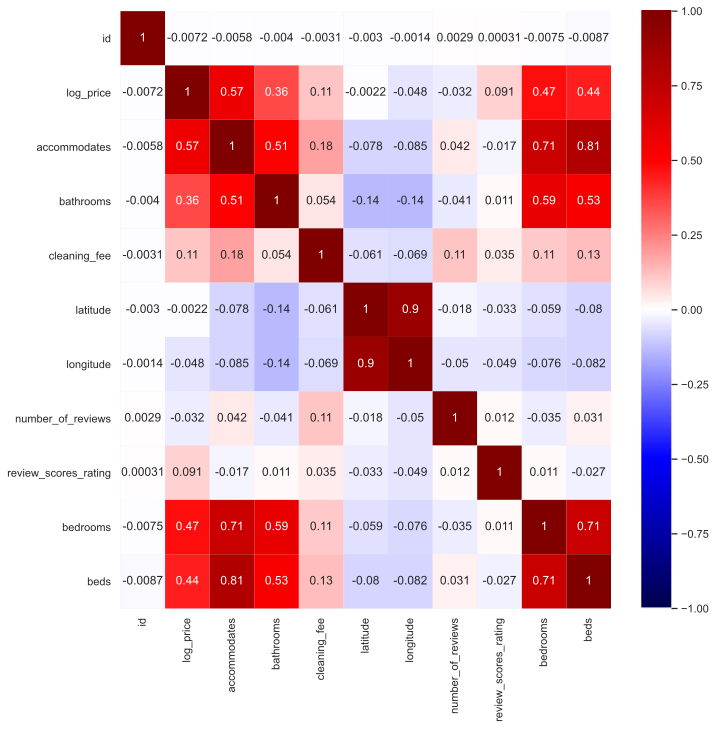

In [31]:
plt.figure(figsize=(11,11))
sns.heatmap(df.corr(), cmap="seismic", annot=True, vmin=-1, vmax=1)

# Date

In [32]:
df["last_review"] = pd.to_datetime(df["last_review"])
df["first_review"] = pd.to_datetime(df["first_review"])
df["host_since"] = pd.to_datetime(df["host_since"])

# Replac missing values with previous date

In [33]:
df.last_review.fillna(method="ffill",inplace=True)
df.first_review.fillna(method="ffill",inplace=True)
df.host_since.fillna(method="ffill",inplace=True)

# Handling Missing Values 

> #### 1. Bathrooms

In [34]:
df.bathrooms.unique()

array([1. , 1.5, 2. , nan, 2.5, 3. , 0.5, 4.5, 5. , 0. , 4. , 3.5, 5.5,
       7.5, 6. , 8. , 7. , 6.5])

^ It is not logical for the bathrooms to be the flutes numbers, because in fact, for example, there is no bathroom and a half!

In [35]:
df["bathrooms"]=df["bathrooms"].round()

In [36]:
df["bathrooms"].mode()

0    1.0
dtype: float64

In [37]:
df["bathrooms"].mean()

1.2513022418855109

In [38]:
df["bathrooms"] = df['bathrooms'].fillna(round(df["bathrooms"].mean()))

In [39]:
#df["bathrooms"] = df['bathrooms'].fillna(df["bathrooms"].mode())

In [40]:
df["bathrooms"].value_counts()

1.0    58299
2.0    13304
3.0     1066
4.0      831
0.0      407
6.0       75
5.0       72
8.0       47
7.0       10
Name: bathrooms, dtype: int64

> #### 2. review

Missing values in column "review_scores_rating" are related to column "number_of_reviews".

In [41]:
df[["number_of_reviews","review_scores_rating"]][df.number_of_reviews == 0]

,number_of_reviews,review_scores_rating
3,0,NaN
12,0,NaN
15,0,NaN
24,0,NaN
31,0,NaN
...,...,...
74083,0,NaN
74089,0,NaN
74095,0,NaN
74106,0,NaN


In [42]:
df["review_scores_rating"] = df["review_scores_rating"].fillna(0)

In [43]:
df["review_scores_rating"].unique()

array([100.,  93.,  92.,   0.,  40.,  97.,  99.,  90.,  89.,  91.,  88.,
        86.,  72.,  98.,  95.,  96.,  84.,  80.,  94.,  87.,  85.,  70.,
        60.,  75.,  20.,  76.,  83.,  82.,  78.,  73.,  55.,  81.,  67.,
        71.,  77.,  79.,  47.,  74.,  68.,  66.,  63.,  50.,  53.,  65.,
        64.,  27.,  69.,  30.,  58.,  35.,  62.,  49.,  57.,  54.,  56.])

> #### 3. bedrooms

In [44]:
df.bedrooms.unique()

array([ 1.,  3.,  2.,  0.,  4., nan,  5.,  6.,  7.,  8.,  9., 10.])

In [45]:
df["bedrooms"].mean()

1.265793028911105

In [46]:
df["bedrooms"].mode()

0    1.0
dtype: float64

In [47]:
#df["bedrooms"] = df['bedrooms'].fillna(df["bedrooms"].mode())

In [48]:
df["bedrooms"] = df["bedrooms"].fillna(1.0)

In [49]:
df.bedrooms.value_counts()

1.0     49875
2.0     11351
0.0      6715
3.0      4309
4.0      1330
5.0       355
6.0       106
7.0        38
8.0        14
10.0       10
9.0         8
Name: bedrooms, dtype: int64

> #### 4. Beds

In [50]:
df["beds"].unique()

array([ 1.,  3.,  2.,  7.,  4.,  6.,  5., nan, 10.,  8., 16.,  9., 13.,
       12., 11., 14., 15.,  0., 18.])

In [51]:
df["beds"].mean()

1.710867802108678

In [52]:
df["beds"].mode()

0    1.0
dtype: float64

In [53]:
df["beds"] = df["beds"].fillna(2.0)

In [54]:
df["beds"].value_counts()

1.0     45144
2.0     16835
3.0      6442
4.0      3065
5.0      1287
6.0       661
7.0       216
8.0       186
10.0       88
9.0        72
16.0       38
12.0       29
11.0       23
13.0       10
15.0        6
14.0        4
0.0         4
18.0        1
Name: beds, dtype: int64

> #### 5. host has profile pic

In [55]:
df.host_has_profile_pic.unique()

array(['t', nan, 'f'], dtype=object)

In [56]:
df.host_has_profile_pic.value_counts()

t    73697
f      226
Name: host_has_profile_pic, dtype: int64

> #### 6. host_identity_verified

In [57]:
df.host_identity_verified.unique()

array(['t', 'f', nan], dtype=object)

In [58]:
df.host_identity_verified.value_counts()

t    49748
f    24175
Name: host_identity_verified, dtype: int64

the columns host_has_profile_pic and host_identity_verified has boolean values true and false¶


In [59]:
df.replace(to_replace = "t", value = 1,inplace=True) 
df.replace(to_replace = "f", value = 0,inplace=True) 

In [60]:
df["host_has_profile_pic"] = df["host_has_profile_pic"].astype("bool")
df["host_identity_verified"] = df["host_identity_verified"].astype("bool")

In [61]:
df.host_identity_verified.value_counts()

True     49936
False    24175
Name: host_identity_verified, dtype: int64

In [62]:
df.host_has_profile_pic.value_counts()

True     73885
False      226
Name: host_has_profile_pic, dtype: int64

### Changed the datatype to bool of these two columns:

In [63]:
#df["host_has_profile_pic"] = df["host_has_profile_pic"].astype("bool")
#df["host_identity_verified"] = df["host_identity_verified"].astype("bool")

> #### 7.host response rate

In [64]:
df.host_response_rate.unique()

array([nan, '100%', '71%', '68%', '67%', '83%', '50%', '90%', '86%',
       '92%', '82%', '80%', '89%', '93%', '99%', '0%', '88%', '96%',
       '70%', '94%', '91%', '25%', '95%', '98%', '62%', '29%', '33%',
       '81%', '63%', '38%', '60%', '79%', '78%', '75%', '65%', '97%',
       '87%', '40%', '54%', '53%', '58%', '76%', '30%', '64%', '17%',
       '20%', '77%', '73%', '41%', '59%', '57%', '85%', '56%', '42%',
       '44%', '35%', '14%', '74%', '27%', '10%', '84%', '6%', '72%',
       '36%', '55%', '43%', '13%', '39%', '46%', '26%', '61%', '52%',
       '23%', '22%', '69%', '66%', '15%', '11%', '31%', '21%', '47%'],
      dtype=object)

In [65]:
df.host_response_rate = df.host_response_rate.apply(
    lambda x: int(x[:len(x)-1])/100
     if isinstance(x,str) else x )

In [66]:
df.host_response_rate.unique()

array([ nan, 1.  , 0.71, 0.68, 0.67, 0.83, 0.5 , 0.9 , 0.86, 0.92, 0.82,
       0.8 , 0.89, 0.93, 0.99, 0.  , 0.88, 0.96, 0.7 , 0.94, 0.91, 0.25,
       0.95, 0.98, 0.62, 0.29, 0.33, 0.81, 0.63, 0.38, 0.6 , 0.79, 0.78,
       0.75, 0.65, 0.97, 0.87, 0.4 , 0.54, 0.53, 0.58, 0.76, 0.3 , 0.64,
       0.17, 0.2 , 0.77, 0.73, 0.41, 0.59, 0.57, 0.85, 0.56, 0.42, 0.44,
       0.35, 0.14, 0.74, 0.27, 0.1 , 0.84, 0.06, 0.72, 0.36, 0.55, 0.43,
       0.13, 0.39, 0.46, 0.26, 0.61, 0.52, 0.23, 0.22, 0.69, 0.66, 0.15,
       0.11, 0.31, 0.21, 0.47])

In [67]:
df.host_response_rate = df.host_response_rate.fillna(df.host_response_rate.mean())

In [68]:
df.host_response_rate.value_counts()

1.00000    43254
0.94352    18299
0.90000     2277
0.80000     1113
0.00000      883
           ...  
0.15000        1
0.39000        1
0.21000        1
0.06000        1
0.31000        1
Name: host_response_rate, Length: 81, dtype: int64

> #### 8.drob

In [69]:
#id
#description
 ##first_review
 ##last_review
 ##host_since
#host_has_profile_pic
#name
#thumbnail_url
#zipcode
#neighbourhood

In [70]:
df1 = df.drop(['id','description','first_review','last_review','host_since',
                          'host_has_profile_pic','name','thumbnail_url','zipcode','neighbourhood'],axis=1)
df1.columns

Index(['log_price', 'property_type', 'room_type', 'amenities', 'accommodates',
       'bathrooms', 'bed_type', 'cancellation_policy', 'cleaning_fee', 'city',
       'host_identity_verified', 'host_response_rate', 'instant_bookable',
       'latitude', 'longitude', 'number_of_reviews', 'review_scores_rating',
       'bedrooms', 'beds'],
      dtype='object')

In [71]:
df1.isna().sum()

log_price                 0
property_type             0
room_type                 0
amenities                 0
accommodates              0
bathrooms                 0
bed_type                  0
cancellation_policy       0
cleaning_fee              0
city                      0
host_identity_verified    0
host_response_rate        0
instant_bookable          0
latitude                  0
longitude                 0
number_of_reviews         0
review_scores_rating      0
bedrooms                  0
beds                      0
dtype: int64

In [72]:
df1

,log_price,property_type,room_type,amenities,accommodates,bathrooms,bed_type,cancellation_policy,cleaning_fee,city,host_identity_verified,host_response_rate,instant_bookable,latitude,longitude,number_of_reviews,review_scores_rating,bedrooms,beds
0,5.010635,Apartment,Entire home/apt,"{""Wireless Internet"",""Air conditioning"",Kitche...",3,1.0,Real Bed,strict,True,NYC,True,0.94352,0,40.696524,-73.991617,2,100.0,1.0,1.0
1,5.129899,Apartment,Entire home/apt,"{""Wireless Internet"",""Air conditioning"",Kitche...",7,1.0,Real Bed,strict,True,NYC,False,1.00000,1,40.766115,-73.989040,6,93.0,3.0,3.0
2,4.976734,Apartment,Entire home/apt,"{TV,""Cable TV"",""Wireless Internet"",""Air condit...",5,1.0,Real Bed,moderate,True,NYC,True,1.00000,1,40.808110,-73.943756,10,92.0,1.0,3.0
3,6.620073,House,Entire home/apt,"{TV,""Cable TV"",Internet,""Wireless Internet"",Ki...",4,1.0,Real Bed,flexible,True,SF,True,0.94352,0,37.772004,-122.431619,0,0.0,2.0,2.0
4,4.744932,Apartment,Entire home/apt,"{TV,Internet,""Wireless Internet"",""Air conditio...",2,1.0,Real Bed,moderate,True,DC,True,1.00000,1,38.925627,-77.034596,4,40.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
74106,4.605170,Apartment,Private room,{},1,1.0,Real Bed,flexible,False,NYC,True,0.94352,0,40.709025,-73.939405,0,0.0,1.0,1.0
74107,5.043425,Apartment,Entire home/apt,"{TV,""Cable TV"",Internet,""Wireless Internet"",Ki...",4,2.0,Real Bed,moderate,True,LA,False,1.00000,0,33.871549,-118.396053,16,93.0,2.0,4.0
74108,5.220356,Apartment,Entire home/apt,"{TV,Internet,""Wireless Internet"",""Air conditio...",5,1.0,Real Bed,moderate,True,NYC,True,1.00000,1,40.706749,-73.942377,43,94.0,2.0,2.0
74109,5.273000,Apartment,Entire home/apt,"{TV,""Wireless Internet"",""Air conditioning"",Kit...",2,1.0,Real Bed,strict,True,NYC,False,1.00000,1,40.738535,-74.000157,0,0.0,0.0,2.0


> #### 9.amenities

In [73]:
df1['amenities']

0        {"Wireless Internet","Air conditioning",Kitche...
1        {"Wireless Internet","Air conditioning",Kitche...
2        {TV,"Cable TV","Wireless Internet","Air condit...
3        {TV,"Cable TV",Internet,"Wireless Internet",Ki...
4        {TV,Internet,"Wireless Internet","Air conditio...
                               ...                        
74106                                                   {}
74107    {TV,"Cable TV",Internet,"Wireless Internet",Ki...
74108    {TV,Internet,"Wireless Internet","Air conditio...
74109    {TV,"Wireless Internet","Air conditioning",Kit...
74110    {TV,Internet,"Wireless Internet",Kitchen,"Free...
Name: amenities, Length: 74111, dtype: object

In [74]:
#Composite type attr.
amenities_col = []
amenities_map = {}
for s in df1.amenities:
    s = s.replace('{','')
    s = s.replace('}','')
    s = s.replace('"','')
    s = s.split(',')
    amenities_col.append(max(len(s)-1,0))
    for k in s:
        if amenities_map.get(k) != None:
            amenities_map[k] +=1 
    else:
        amenities_map[k] = 1

In [75]:
amenities_col

[8,
 14,
 18,
 14,
 11,
 9,
 20,
 25,
 20,
 12,
 14,
 21,
 16,
 24,
 6,
 11,
 17,
 18,
 17,
 23,
 20,
 10,
 28,
 15,
 13,
 43,
 13,
 20,
 14,
 17,
 21,
 14,
 26,
 13,
 28,
 16,
 27,
 17,
 7,
 24,
 18,
 22,
 14,
 14,
 15,
 13,
 13,
 15,
 7,
 21,
 19,
 14,
 13,
 14,
 19,
 16,
 16,
 15,
 26,
 19,
 25,
 16,
 13,
 12,
 0,
 17,
 15,
 21,
 22,
 15,
 16,
 5,
 9,
 7,
 20,
 9,
 13,
 14,
 12,
 13,
 12,
 14,
 19,
 15,
 42,
 23,
 13,
 18,
 17,
 7,
 15,
 11,
 8,
 10,
 14,
 18,
 14,
 19,
 16,
 20,
 9,
 19,
 13,
 19,
 28,
 21,
 11,
 14,
 15,
 22,
 9,
 8,
 17,
 4,
 4,
 30,
 1,
 14,
 6,
 13,
 17,
 8,
 12,
 17,
 31,
 8,
 19,
 12,
 21,
 13,
 18,
 24,
 11,
 10,
 11,
 18,
 22,
 25,
 5,
 10,
 25,
 19,
 1,
 22,
 18,
 14,
 22,
 6,
 7,
 25,
 12,
 10,
 11,
 23,
 40,
 20,
 20,
 14,
 19,
 17,
 14,
 29,
 29,
 8,
 23,
 2,
 12,
 18,
 9,
 41,
 8,
 17,
 29,
 22,
 27,
 20,
 10,
 18,
 13,
 23,
 14,
 15,
 27,
 6,
 22,
 12,
 8,
 18,
 18,
 26,
 23,
 22,
 23,
 14,
 16,
 13,
 21,
 14,
 16,
 19,
 25,
 32,
 30,
 17,
 25,
 22,
 

In [76]:
df1['amenities_count'] = pd.Series(amenities_col)

In [77]:
df1['amenities_count'].unique()

array([ 8, 14, 18, 11,  9, 20, 25, 12, 21, 16, 24,  6, 17, 23, 10, 28, 15,
       13, 43, 26, 27,  7, 22, 19,  0,  5, 42,  4, 30,  1, 31, 40, 29,  2,
       41, 32, 36, 37,  3, 38, 48, 35, 33, 39, 34, 56, 47, 44, 46, 50, 54,
       52, 45, 51, 57, 61, 49, 69, 60, 67, 53, 58, 59, 55, 77, 62, 63, 71,
       70, 85, 76, 68])

In [78]:
df1['amenities_count'].value_counts()

15    4665
16    4573
14    4494
18    4417
17    4396
      ... 
77       1
68       1
71       1
76       1
70       1
Name: amenities_count, Length: 72, dtype: int64

In [79]:
df1 = df1.drop(['amenities'], axis=1)

In [80]:
df1

,log_price,property_type,room_type,accommodates,bathrooms,bed_type,cancellation_policy,cleaning_fee,city,host_identity_verified,host_response_rate,instant_bookable,latitude,longitude,number_of_reviews,review_scores_rating,bedrooms,beds,amenities_count
0,5.010635,Apartment,Entire home/apt,3,1.0,Real Bed,strict,True,NYC,True,0.94352,0,40.696524,-73.991617,2,100.0,1.0,1.0,8
1,5.129899,Apartment,Entire home/apt,7,1.0,Real Bed,strict,True,NYC,False,1.00000,1,40.766115,-73.989040,6,93.0,3.0,3.0,14
2,4.976734,Apartment,Entire home/apt,5,1.0,Real Bed,moderate,True,NYC,True,1.00000,1,40.808110,-73.943756,10,92.0,1.0,3.0,18
3,6.620073,House,Entire home/apt,4,1.0,Real Bed,flexible,True,SF,True,0.94352,0,37.772004,-122.431619,0,0.0,2.0,2.0,14
4,4.744932,Apartment,Entire home/apt,2,1.0,Real Bed,moderate,True,DC,True,1.00000,1,38.925627,-77.034596,4,40.0,0.0,1.0,11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
74106,4.605170,Apartment,Private room,1,1.0,Real Bed,flexible,False,NYC,True,0.94352,0,40.709025,-73.939405,0,0.0,1.0,1.0,0
74107,5.043425,Apartment,Entire home/apt,4,2.0,Real Bed,moderate,True,LA,False,1.00000,0,33.871549,-118.396053,16,93.0,2.0,4.0,15
74108,5.220356,Apartment,Entire home/apt,5,1.0,Real Bed,moderate,True,NYC,True,1.00000,1,40.706749,-73.942377,43,94.0,2.0,2.0,30
74109,5.273000,Apartment,Entire home/apt,2,1.0,Real Bed,strict,True,NYC,False,1.00000,1,40.738535,-74.000157,0,0.0,0.0,2.0,14


# 9.Factorization of categorical columns

### 1- room_type

In [81]:
df1.room_type.unique()

array(['Entire home/apt', 'Private room', 'Shared room'], dtype=object)

In [82]:
df1.room_type.value_counts()

Entire home/apt    41310
Private room       30638
Shared room         2163
Name: room_type, dtype: int64

In [83]:
def room_type_cleaning(x):
    if x=='Entire home/apt':
        x= 3
    elif x=='Private room':
        x= 2
    elif x=='Shared room':
        x= 1
    return x
df1['room_type']=df1['room_type'].map(lambda x: room_type_cleaning(x))

In [84]:
#df1.room_type = df1.room_type.apply(lambda x: 3 if x=='Entire home/apt' else 2 if x=='Private room' else 1)

In [85]:
df1

,log_price,property_type,room_type,accommodates,bathrooms,bed_type,cancellation_policy,cleaning_fee,city,host_identity_verified,host_response_rate,instant_bookable,latitude,longitude,number_of_reviews,review_scores_rating,bedrooms,beds,amenities_count
0,5.010635,Apartment,3,3,1.0,Real Bed,strict,True,NYC,True,0.94352,0,40.696524,-73.991617,2,100.0,1.0,1.0,8
1,5.129899,Apartment,3,7,1.0,Real Bed,strict,True,NYC,False,1.00000,1,40.766115,-73.989040,6,93.0,3.0,3.0,14
2,4.976734,Apartment,3,5,1.0,Real Bed,moderate,True,NYC,True,1.00000,1,40.808110,-73.943756,10,92.0,1.0,3.0,18
3,6.620073,House,3,4,1.0,Real Bed,flexible,True,SF,True,0.94352,0,37.772004,-122.431619,0,0.0,2.0,2.0,14
4,4.744932,Apartment,3,2,1.0,Real Bed,moderate,True,DC,True,1.00000,1,38.925627,-77.034596,4,40.0,0.0,1.0,11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
74106,4.605170,Apartment,2,1,1.0,Real Bed,flexible,False,NYC,True,0.94352,0,40.709025,-73.939405,0,0.0,1.0,1.0,0
74107,5.043425,Apartment,3,4,2.0,Real Bed,moderate,True,LA,False,1.00000,0,33.871549,-118.396053,16,93.0,2.0,4.0,15
74108,5.220356,Apartment,3,5,1.0,Real Bed,moderate,True,NYC,True,1.00000,1,40.706749,-73.942377,43,94.0,2.0,2.0,30
74109,5.273000,Apartment,3,2,1.0,Real Bed,strict,True,NYC,False,1.00000,1,40.738535,-74.000157,0,0.0,0.0,2.0,14


### 2- bed_type

In [86]:
df1.bed_type.unique()

array(['Real Bed', 'Futon', 'Pull-out Sofa', 'Couch', 'Airbed'],
      dtype=object)

In [87]:
df1.bed_type.value_counts()

Real Bed         72028
Futon              753
Pull-out Sofa      585
Airbed             477
Couch              268
Name: bed_type, dtype: int64

In [88]:
df1.bed_type = df.bed_type.map(lambda x: 2 if x=='Real Bed' else 1)

In [89]:
df1

,log_price,property_type,room_type,accommodates,bathrooms,bed_type,cancellation_policy,cleaning_fee,city,host_identity_verified,host_response_rate,instant_bookable,latitude,longitude,number_of_reviews,review_scores_rating,bedrooms,beds,amenities_count
0,5.010635,Apartment,3,3,1.0,2,strict,True,NYC,True,0.94352,0,40.696524,-73.991617,2,100.0,1.0,1.0,8
1,5.129899,Apartment,3,7,1.0,2,strict,True,NYC,False,1.00000,1,40.766115,-73.989040,6,93.0,3.0,3.0,14
2,4.976734,Apartment,3,5,1.0,2,moderate,True,NYC,True,1.00000,1,40.808110,-73.943756,10,92.0,1.0,3.0,18
3,6.620073,House,3,4,1.0,2,flexible,True,SF,True,0.94352,0,37.772004,-122.431619,0,0.0,2.0,2.0,14
4,4.744932,Apartment,3,2,1.0,2,moderate,True,DC,True,1.00000,1,38.925627,-77.034596,4,40.0,0.0,1.0,11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
74106,4.605170,Apartment,2,1,1.0,2,flexible,False,NYC,True,0.94352,0,40.709025,-73.939405,0,0.0,1.0,1.0,0
74107,5.043425,Apartment,3,4,2.0,2,moderate,True,LA,False,1.00000,0,33.871549,-118.396053,16,93.0,2.0,4.0,15
74108,5.220356,Apartment,3,5,1.0,2,moderate,True,NYC,True,1.00000,1,40.706749,-73.942377,43,94.0,2.0,2.0,30
74109,5.273000,Apartment,3,2,1.0,2,strict,True,NYC,False,1.00000,1,40.738535,-74.000157,0,0.0,0.0,2.0,14


### 3- city

In [90]:
df1['city'].unique()

array(['NYC', 'SF', 'DC', 'LA', 'Chicago', 'Boston'], dtype=object)

In [91]:
df1['city'].value_counts()

NYC        32349
LA         22453
SF          6434
DC          5688
Chicago     3719
Boston      3468
Name: city, dtype: int64

In [92]:
df1 = pd.concat([df1, pd.get_dummies(df1['city'], prefix='city')],axis=1)

In [93]:
df1 = df1.drop(['city'],axis=1)

In [94]:
df1

,log_price,property_type,room_type,accommodates,bathrooms,bed_type,cancellation_policy,cleaning_fee,host_identity_verified,host_response_rate,...,review_scores_rating,bedrooms,beds,amenities_count,city_Boston,city_Chicago,city_DC,city_LA,city_NYC,city_SF
0,5.010635,Apartment,3,3,1.0,2,strict,True,True,0.94352,...,100.0,1.0,1.0,8,0,0,0,0,1,0
1,5.129899,Apartment,3,7,1.0,2,strict,True,False,1.00000,...,93.0,3.0,3.0,14,0,0,0,0,1,0
2,4.976734,Apartment,3,5,1.0,2,moderate,True,True,1.00000,...,92.0,1.0,3.0,18,0,0,0,0,1,0
3,6.620073,House,3,4,1.0,2,flexible,True,True,0.94352,...,0.0,2.0,2.0,14,0,0,0,0,0,1
4,4.744932,Apartment,3,2,1.0,2,moderate,True,True,1.00000,...,40.0,0.0,1.0,11,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
74106,4.605170,Apartment,2,1,1.0,2,flexible,False,True,0.94352,...,0.0,1.0,1.0,0,0,0,0,0,1,0
74107,5.043425,Apartment,3,4,2.0,2,moderate,True,False,1.00000,...,93.0,2.0,4.0,15,0,0,0,1,0,0
74108,5.220356,Apartment,3,5,1.0,2,moderate,True,True,1.00000,...,94.0,2.0,2.0,30,0,0,0,0,1,0
74109,5.273000,Apartment,3,2,1.0,2,strict,True,False,1.00000,...,0.0,0.0,2.0,14,0,0,0,0,1,0


## 4- property_type

In [95]:
df1.property_type.unique()

array(['Apartment', 'House', 'Condominium', 'Loft', 'Townhouse', 'Hostel',
       'Guest suite', 'Bed & Breakfast', 'Bungalow', 'Guesthouse', 'Dorm',
       'Other', 'Camper/RV', 'Villa', 'Boutique hotel', 'Timeshare',
       'In-law', 'Boat', 'Serviced apartment', 'Castle', 'Cabin',
       'Treehouse', 'Tipi', 'Vacation home', 'Tent', 'Hut',
       'Casa particular', 'Chalet', 'Yurt', 'Earth House',
       'Parking Space', 'Train', 'Cave', 'Lighthouse', 'Island'],
      dtype=object)

In [96]:
df1.property_type.value_counts()

Apartment             49003
House                 16511
Condominium            2658
Townhouse              1692
Loft                   1244
Other                   607
Guesthouse              498
Bed & Breakfast         462
Bungalow                366
Villa                   179
Dorm                    142
Guest suite             123
Camper/RV                94
Timeshare                77
Cabin                    72
In-law                   71
Hostel                   70
Boutique hotel           69
Boat                     65
Serviced apartment       21
Tent                     18
Castle                   13
Vacation home            11
Yurt                      9
Hut                       8
Treehouse                 7
Chalet                    6
Earth House               4
Tipi                      3
Train                     2
Cave                      2
Casa particular           1
Lighthouse                1
Island                    1
Parking Space             1
Name: property_type,

In [97]:
nbh_counts = df1.property_type.value_counts()

In [98]:
other_nbhs = list(nbh_counts[nbh_counts <= 100].index)

In [99]:
df1['property_type'] = df1['property_type'].replace(other_nbhs,"Other")

In [100]:
df1['property_type'].unique()

array(['Apartment', 'House', 'Condominium', 'Loft', 'Townhouse', 'Other',
       'Guest suite', 'Bed & Breakfast', 'Bungalow', 'Guesthouse', 'Dorm',
       'Villa'], dtype=object)

In [101]:
df1['property_type'].value_counts()

Apartment          49003
House              16511
Condominium         2658
Townhouse           1692
Loft                1244
Other               1233
Guesthouse           498
Bed & Breakfast      462
Bungalow             366
Villa                179
Dorm                 142
Guest suite          123
Name: property_type, dtype: int64

In [102]:
df1 = pd.concat([df1, pd.get_dummies(df1['property_type'], prefix='property_type')],axis=1)

In [103]:
df1

,log_price,property_type,room_type,accommodates,bathrooms,bed_type,cancellation_policy,cleaning_fee,host_identity_verified,host_response_rate,...,property_type_Bungalow,property_type_Condominium,property_type_Dorm,property_type_Guest suite,property_type_Guesthouse,property_type_House,property_type_Loft,property_type_Other,property_type_Townhouse,property_type_Villa
0,5.010635,Apartment,3,3,1.0,2,strict,True,True,0.94352,...,0,0,0,0,0,0,0,0,0,0
1,5.129899,Apartment,3,7,1.0,2,strict,True,False,1.00000,...,0,0,0,0,0,0,0,0,0,0
2,4.976734,Apartment,3,5,1.0,2,moderate,True,True,1.00000,...,0,0,0,0,0,0,0,0,0,0
3,6.620073,House,3,4,1.0,2,flexible,True,True,0.94352,...,0,0,0,0,0,1,0,0,0,0
4,4.744932,Apartment,3,2,1.0,2,moderate,True,True,1.00000,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
74106,4.605170,Apartment,2,1,1.0,2,flexible,False,True,0.94352,...,0,0,0,0,0,0,0,0,0,0
74107,5.043425,Apartment,3,4,2.0,2,moderate,True,False,1.00000,...,0,0,0,0,0,0,0,0,0,0
74108,5.220356,Apartment,3,5,1.0,2,moderate,True,True,1.00000,...,0,0,0,0,0,0,0,0,0,0
74109,5.273000,Apartment,3,2,1.0,2,strict,True,False,1.00000,...,0,0,0,0,0,0,0,0,0,0


In [104]:
df1 = df1.drop(['property_type'],axis=1)

In [105]:

#property_type_dict1 = {'Apartment':['Condominium','Loft','Serviced apartment','Guest suite'],
        # 'House':['Vacation home','Villa','Townhouse','In-law','Casa particular'],
     #    'Hotel1':['Dorm','Hostel','Guesthouse'],
    #     'Hotel2':['Boutique hotel','Bed & Breakfast'],
    #     'Timeshare':['Timeshare'],
     #    'Other':['Island','Castle','Yurt','Hut','Chalet','Treehouse',
      #            'Earth House','Tipi','Cave','Train','Parking Space','Lighthouse',
       #          'Tent','Boat','Cabin','Camper/RV','Bungalow']
       # }

#property_type_dict2 = {i : k for k, v in property_type_dict1.items() for i in v}

#df1['property_group'] = df1['property_type'].replace(property_type_dict2)

#df1.drop('property_type',axis=1,inplace=True)



In [106]:
#df1['property_group']

In [107]:
#df1 = pd.concat([df1, pd.get_dummies(df1['property_group'], prefix='property_group')],axis=1)

In [108]:
#df1 = df1.drop(['property_group'],axis=1)

In [109]:
#df1

## 5-cancellation_policy

In [110]:
df1['cancellation_policy'].unique()

array(['strict', 'moderate', 'flexible', 'super_strict_30',
       'super_strict_60'], dtype=object)

In [111]:
df1['cancellation_policy'].value_counts()

strict             32374
flexible           22545
moderate           19063
super_strict_30      112
super_strict_60       17
Name: cancellation_policy, dtype: int64

In [112]:
def cancellation_policy_cleaning(x):
    if x=='super_strict_60':
        x= 5
    elif x=='super_strict_30':
        x= 4
    elif x=='strict':
        x= 3
    elif x=='moderate':
        x= 2
    elif x=='flexible':
        x= 1     
    return x
df1['cancellation_policy']=df1['cancellation_policy'].map(lambda x: cancellation_policy_cleaning(x))

In [113]:
df1['cancellation_policy'].value_counts()

3    32374
1    22545
2    19063
4      112
5       17
Name: cancellation_policy, dtype: int64

In [114]:
df1

,log_price,room_type,accommodates,bathrooms,bed_type,cancellation_policy,cleaning_fee,host_identity_verified,host_response_rate,instant_bookable,...,property_type_Bungalow,property_type_Condominium,property_type_Dorm,property_type_Guest suite,property_type_Guesthouse,property_type_House,property_type_Loft,property_type_Other,property_type_Townhouse,property_type_Villa
0,5.010635,3,3,1.0,2,3,True,True,0.94352,0,...,0,0,0,0,0,0,0,0,0,0
1,5.129899,3,7,1.0,2,3,True,False,1.00000,1,...,0,0,0,0,0,0,0,0,0,0
2,4.976734,3,5,1.0,2,2,True,True,1.00000,1,...,0,0,0,0,0,0,0,0,0,0
3,6.620073,3,4,1.0,2,1,True,True,0.94352,0,...,0,0,0,0,0,1,0,0,0,0
4,4.744932,3,2,1.0,2,2,True,True,1.00000,1,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
74106,4.605170,2,1,1.0,2,1,False,True,0.94352,0,...,0,0,0,0,0,0,0,0,0,0
74107,5.043425,3,4,2.0,2,2,True,False,1.00000,0,...,0,0,0,0,0,0,0,0,0,0
74108,5.220356,3,5,1.0,2,2,True,True,1.00000,1,...,0,0,0,0,0,0,0,0,0,0
74109,5.273000,3,2,1.0,2,3,True,False,1.00000,1,...,0,0,0,0,0,0,0,0,0,0


## 6-cleaning_fee and host_identity_verified

In [115]:
df1.replace(to_replace = True , value = 1,inplace=True) 
df1.replace(to_replace = False , value = 0,inplace=True)

In [116]:
df1

,log_price,room_type,accommodates,bathrooms,bed_type,cancellation_policy,cleaning_fee,host_identity_verified,host_response_rate,instant_bookable,...,property_type_Bungalow,property_type_Condominium,property_type_Dorm,property_type_Guest suite,property_type_Guesthouse,property_type_House,property_type_Loft,property_type_Other,property_type_Townhouse,property_type_Villa
0,5.010635,3,3,1.0,2,3,1.0,1.0,0.94352,0,...,0,0,0,0,0,0,0,0,0,0
1,5.129899,3,7,1.0,2,3,1.0,0.0,1.00000,1,...,0,0,0,0,0,0,0,0,0,0
2,4.976734,3,5,1.0,2,2,1.0,1.0,1.00000,1,...,0,0,0,0,0,0,0,0,0,0
3,6.620073,3,4,1.0,2,1,1.0,1.0,0.94352,0,...,0,0,0,0,0,1,0,0,0,0
4,4.744932,3,2,1.0,2,2,1.0,1.0,1.00000,1,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
74106,4.605170,2,1,1.0,2,1,0.0,1.0,0.94352,0,...,0,0,0,0,0,0,0,0,0,0
74107,5.043425,3,4,2.0,2,2,1.0,0.0,1.00000,0,...,0,0,0,0,0,0,0,0,0,0
74108,5.220356,3,5,1.0,2,2,1.0,1.0,1.00000,1,...,0,0,0,0,0,0,0,0,0,0
74109,5.273000,3,2,1.0,2,3,1.0,0.0,1.00000,1,...,0,0,0,0,0,0,0,0,0,0


In [117]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 74111 entries, 0 to 74110
Data columns (total 35 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   log_price                      74111 non-null  float64
 1   room_type                      74111 non-null  int64  
 2   accommodates                   74111 non-null  int64  
 3   bathrooms                      74111 non-null  float64
 4   bed_type                       74111 non-null  int64  
 5   cancellation_policy            74111 non-null  int64  
 6   cleaning_fee                   74111 non-null  float64
 7   host_identity_verified         74111 non-null  float64
 8   host_response_rate             74111 non-null  float64
 9   instant_bookable               74111 non-null  int64  
 10  latitude                       74111 non-null  float64
 11  longitude                      74111 non-null  float64
 12  number_of_reviews              74111 non-null 

<AxesSubplot:>

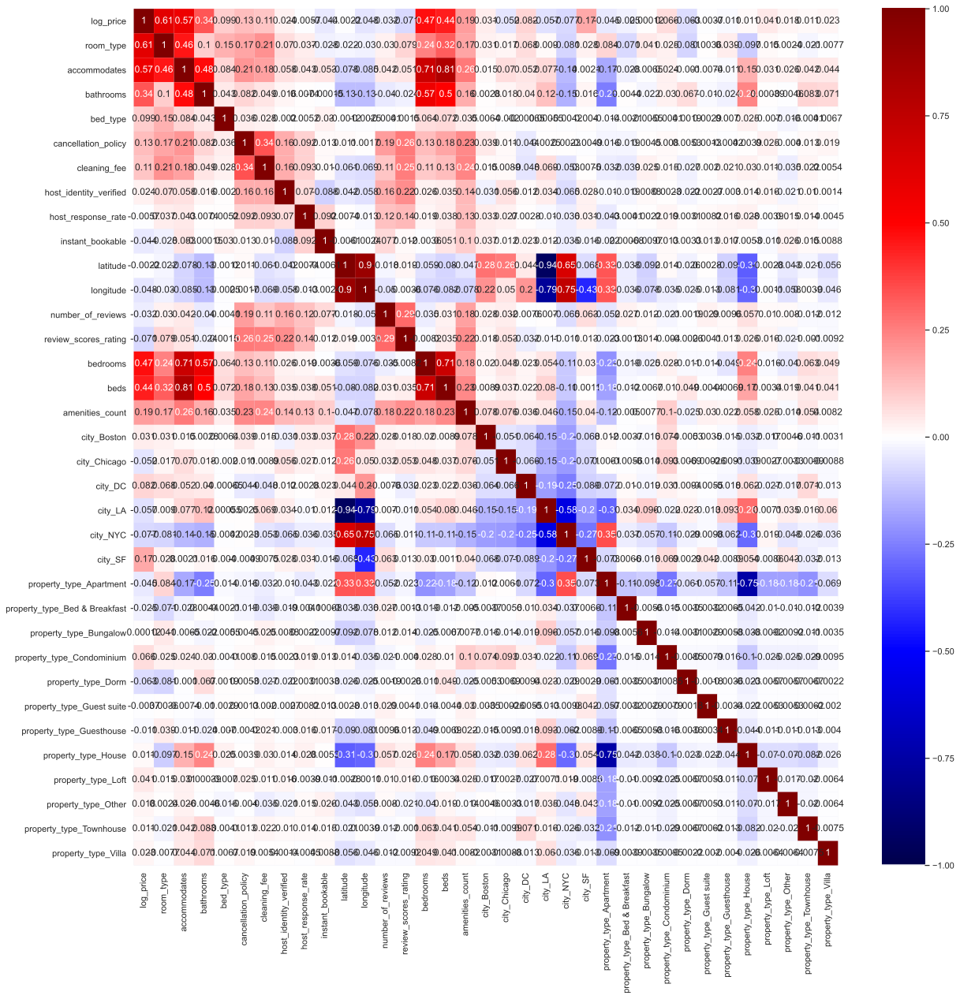

In [118]:
plt.figure(figsize=(20,20))
sns.heatmap(df1.corr(), cmap="seismic", annot=True, vmin=-1, vmax=1)

# Validation Method: Train / Validation / Test

In [119]:
df1

,log_price,room_type,accommodates,bathrooms,bed_type,cancellation_policy,cleaning_fee,host_identity_verified,host_response_rate,instant_bookable,...,property_type_Bungalow,property_type_Condominium,property_type_Dorm,property_type_Guest suite,property_type_Guesthouse,property_type_House,property_type_Loft,property_type_Other,property_type_Townhouse,property_type_Villa
0,5.010635,3,3,1.0,2,3,1.0,1.0,0.94352,0,...,0,0,0,0,0,0,0,0,0,0
1,5.129899,3,7,1.0,2,3,1.0,0.0,1.00000,1,...,0,0,0,0,0,0,0,0,0,0
2,4.976734,3,5,1.0,2,2,1.0,1.0,1.00000,1,...,0,0,0,0,0,0,0,0,0,0
3,6.620073,3,4,1.0,2,1,1.0,1.0,0.94352,0,...,0,0,0,0,0,1,0,0,0,0
4,4.744932,3,2,1.0,2,2,1.0,1.0,1.00000,1,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
74106,4.605170,2,1,1.0,2,1,0.0,1.0,0.94352,0,...,0,0,0,0,0,0,0,0,0,0
74107,5.043425,3,4,2.0,2,2,1.0,0.0,1.00000,0,...,0,0,0,0,0,0,0,0,0,0
74108,5.220356,3,5,1.0,2,2,1.0,1.0,1.00000,1,...,0,0,0,0,0,0,0,0,0,0
74109,5.273000,3,2,1.0,2,3,1.0,0.0,1.00000,1,...,0,0,0,0,0,0,0,0,0,0


In [120]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, Ridge #ordinary linear regression + w/ ridge regularization
from sklearn.preprocessing import StandardScaler, PolynomialFeatures

In [121]:
import statsmodels.api as sm
import statsmodels.formula.api as smf
import patsy 
import scipy.stats as stats

%matplotlib inline

In [122]:
X, y = df1.drop(['log_price'],axis=1), df1['log_price']

In [123]:
X, X_test, y, y_test = train_test_split(X, y, test_size=.2, random_state=10)

In [124]:
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=.25, random_state=3)

In [125]:
# fit model 
model = sm.OLS(y_train, X_train, data=df1)

results = model.fit()

# summarize our model
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              log_price   R-squared:                       0.575
Model:                            OLS   Adj. R-squared:                  0.574
Method:                 Least Squares   F-statistic:                     1876.
Date:                Fri, 26 Nov 2021   Prob (F-statistic):               0.00
Time:                        16:53:46   Log-Likelihood:                -29228.
No. Observations:               44466   AIC:                         5.852e+04
Df Residuals:                   44433   BIC:                         5.881e+04
Df Model:                          32                                         
Covariance Type:            nonrobust                                         
=================================================================================================
                                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
room_type                         0.5764      0.005    118.936      0.000       0.567       0.586
accommodates                      0.0858      0.002     41.934      0.000       0.082       0.090
bathrooms                         0.1192      0.005     25.399      0.000       0.110       0.128
bed_type                          0.0015      0.014      0.112      0.911      -0.025       0.028
cancellation_policy               0.0111      0.003      3.826      0.000       0.005       0.017
cleaning_fee                     -0.0421      0.006     -7.511      0.000      -0.053      -0.031
host_identity_verified           -0.0061      0.005     -1.227      0.220      -0.016       0.004
host_response_rate               -0.1011      0.016     -6.327      0.000      -0.132      -0.070
instant_bookable                 -0.0577      0.005    -11.183      0.000      -0.068      -0.048
latitude                          0.0905      0.033      2.770      0.006       0.026       0.155
longitude                        -1.0130      0.025    -40.307      0.000      -1.062      -0.964
number_of_reviews                -0.0005   6.36e-05     -7.284      0.000      -0.001      -0.000
review_scores_rating             -0.0019   6.21e-05    -30.747      0.000      -0.002      -0.002
bedrooms                          0.1481      0.004     34.934      0.000       0.140       0.156
beds                             -0.0466      0.003    -14.289      0.000      -0.053      -0.040
amenities_count                   0.0053      0.000     14.832      0.000       0.005       0.006
city_Boston                     -41.6572      1.337    -31.149      0.000     -44.278     -39.036
city_Chicago                    -58.7078      1.650    -35.590      0.000     -61.941     -55.475
city_DC                         -47.3205      1.382    -34.231      0.000     -50.030     -44.611
city_LA                         -88.9012      2.254    -39.435      0.000     -93.320     -84.483
city_NYC                        -44.4280      1.357    -32.746      0.000     -47.087     -41.769
city_SF                         -92.9361      2.381    -39.030      0.000     -97.603     -88.269
property_type_Apartment         -31.1827      0.849    -36.739      0.000     -32.846     -29.519
property_type_Bed & Breakfast   -30.9912      0.849    -36.507      0.000     -32.655     -29.327
property_type_Bungalow          -31.1916      0.849    -36.727      0.000     -32.856     -29.527
property_type_Condominium       -31.0560      0.849    -36.601      0.000     -32.719     -29.393
property_type_Dorm              -31.5723      0.850    -37.157      0.000     -33.238     -29.907
property_type_Guest suite       -31.2604      0.850    -36.798      0.000     -32.925     -29.595
property_type_Guesthouse        -31.2561     

In [126]:
stats.probplot(df1['log_price'], dist="norm", plot=plt)
plt.title("Normal Q-Q plot")
plt.show()

In [127]:
#set up the 3 models we're choosing from:

lm = LinearRegression()

#Feature scaling for train, val, and test so that we can run our ridge model on each
scaler = StandardScaler()

X_train_scaled = scaler.fit_transform(X_train.values)
X_val_scaled = scaler.transform(X_val.values)

lm_reg = Ridge(alpha=1)

#Feature transforms for train, val, and test so that we can run our poly model on each
poly = PolynomialFeatures(degree=2) 

X_train_poly = poly.fit_transform(X_train.values)
X_val_poly = poly.transform(X_val.values)


lm_poly = LinearRegression()

In [128]:
#validate

lm.fit(X_train, y_train)
print(f'Linear Regression val R^2: {lm.score(X_val, y_val):.3f}')

lm_reg.fit(X_train_scaled, y_train)
print(f'Ridge Regression val R^2: {lm_reg.score(X_val_scaled, y_val):.3f}')

lm_poly.fit(X_train_poly, y_train)
print(f'Degree 2 polynomial regression val R^2: {lm_poly.score(X_val_poly, y_val):.3f}')

Linear Regression val R^2: 0.588
Ridge Regression val R^2: 0.579
Degree 2 polynomial regression val R^2: 0.620
